In [1]:
!pip install efficientnet





     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.9 MB/s eta 0:00:00


















In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Activation, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import efficientnet.tfkeras as efn

from keras.models import Sequential, Model
from PIL import Image
from skimage import transform
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter
import itertools
import cv2

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']

caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']

  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']

caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10t

In [3]:
train_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/train/'
valid_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/val/'
test_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/test/'

In [4]:
photo_size=299

In [5]:
def prepare_dataset(data_dir):
    datagen = ImageDataGenerator(
        rescale= 1./255,
        rotation_range=40,
        width_shift_range=.2,
        height_shift_range=.2,
        shear_range=.1,
        zoom_range=.2,
        horizontal_flip=True,
        fill_mode='nearest',
    )
    generator = datagen.flow_from_directory(
        data_dir,
        shuffle=True,
        color_mode = "rgb",
        target_size=(photo_size,photo_size),
        class_mode='binary',
        batch_size=128,
        classes=['NORMAL','PNEUMONIA']
    )
    return generator

In [6]:
train_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/train/')
validation_generator = prepare_dataset('../input/chest-xray-pneumonia/chest_xray/val/')
test_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/test/')

Found 5216 images belonging to 2 classes.

Found 16 images belonging to 2 classes.

Found 624 images belonging to 2 classes.


In [7]:
validation_generator.class_indices

{'NORMAL': 0, 'PNEUMONIA': 1}

In [8]:
def show_few_images(number_of_examples=6, models=None):
    figure1, ax1 = plt.subplots(number_of_examples,len(os.listdir(test_folders)), figsize=(20,4*number_of_examples))
    ax1 = ax1.reshape(-1)
    axoff_fun = np.vectorize(lambda ax:ax.axis('off'))
    axoff_fun(ax1)
    axs = 0
    for i, folder in enumerate(os.listdir(test_folders)):
        
        image_ids = os.listdir(os.path.join(test_folders,folder))
        for j in [random.randrange(0, len(image_ids)) for i in range(0,number_of_examples)]:
            path = os.path.join(test_folders,folder,image_ids[j])
            
            display = plt.imread(path)
            plt.axis('off')
            figure1.tight_layout()
            ax1[axs].imshow(display)
            title = 'True: '+folder

            if(models):
                for model in models:
                    if (model==efficientnetb0):
                        img = cv2.resize(cv2.imread(path),(299,299))
                        img_normalized = img/255
                        image_efficientnetb0_prediction = efficientnetb0.predict(np.array([img_normalized])).argmax()
                        if (image_efficientnetb0_prediction==1):
                            title = title+"\nefficientnetb0 Prediction: PNEUMONIA"
                        else:
                            title = title+"\nefficientnetb0 Prediction: NORMAL"
            ax1[axs].set_title(title)
            axs=axs+1

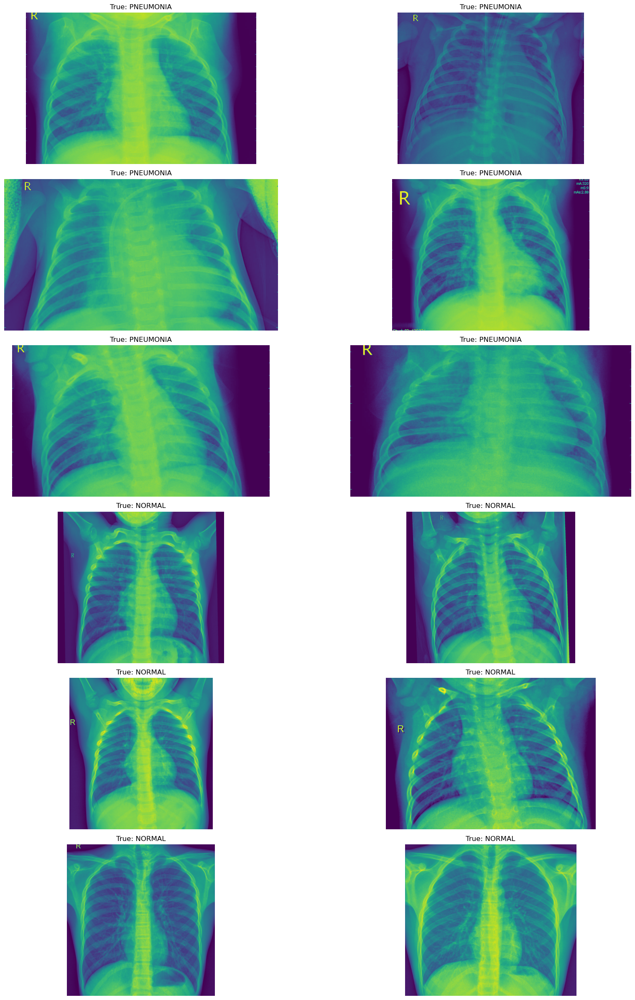

In [9]:
show_few_images()

In [10]:
epochs = 100

In [11]:
EfficientNetB0_model = efn.EfficientNetB0(weights = 'imagenet', include_top = False, input_shape = (299,299, 3))
for layer in EfficientNetB0_model.layers:
    layer.trainable = False
efficientnetb0_x = Flatten()(EfficientNetB0_model.output)
efficientnetb0_x = Dense(512, activation='relu')(efficientnetb0_x)
efficientnetb0_x = Dense(256, activation='relu')(efficientnetb0_x)
efficientnetb0_x = Dropout(0.5)(efficientnetb0_x)
efficientnetb0_x = Dense(2, activation = 'sigmoid')(efficientnetb0_x)
efficientnetb0 = Model(inputs=EfficientNetB0_model.input, outputs=efficientnetb0_x)
efficientnetb0.summary()


16804768/16804768 [==============================] - 0s 0us/step

Model: "model"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               

                                )]                                                                

                                                                                                  

 stem_conv (Conv2D)             (None, 150, 150, 32  864         ['input_1[0][0]']                

                                )                                                                 

                                                                                                  

 stem_bn (BatchNormalization)   (None, 150, 150, 32  128         ['stem_conv[0][0]']              

                

In [12]:
efficientnetb0.compile(loss = 'sparse_categorical_crossentropy', optimizer = Adam(learning_rate=0.001), metrics=['accuracy'])

history_efficientnetb0 = efficientnetb0.fit(
    train_generator,
    epochs = epochs,
    validation_data = validation_generator
    )
efficientnetb0.save("EfficientNetB0_100.h5")

Epoch 1/100


2023-06-26 20:58:44.806788: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


41/41 [==============================] - 236s 5s/step - loss: 3.0743 - accuracy: 0.8253 - val_loss: 3.1319 - val_accuracy: 0.6875

Epoch 2/100

41/41 [==============================] - 173s 4s/step - loss: 0.3259 - accuracy: 0.8999 - val_loss: 1.3695 - val_accuracy: 0.6875

Epoch 3/100

41/41 [==============================] - 172s 4s/step - loss: 0.2117 - accuracy: 0.9183 - val_loss: 0.7672 - val_accuracy: 0.7500

Epoch 4/100

41/41 [==============================] - 173s 4s/step - loss: 0.1707 - accuracy: 0.9348 - val_loss: 0.8538 - val_accuracy: 0.8125

Epoch 5/100

41/41 [==============================] - 171s 4s/step - loss: 0.1603 - accuracy: 0.9421 - val_loss: 0.4555 - val_accuracy: 0.8750

Epoch 6/100

41/41 [==============================] - 171s 4s/step - loss: 0.1480 - accuracy: 0.9438 - val_loss: 1.4355 - val_accuracy: 0.6875

Epoch 7/100

41/41 [==============================] - 170s 4s/step - loss: 0.1408 - accuracy: 0.9467 - val_loss: 1.2347 - val_accuracy: 0.8125

Epoch

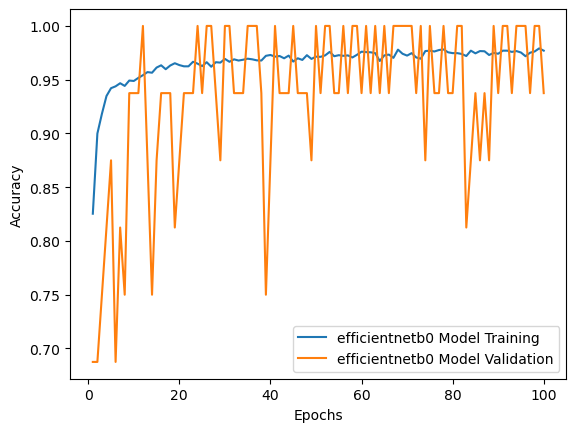

In [13]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.plot(x, history_efficientnetb0.history['accuracy'], label = "efficientnetb0 Model Training", linestyle="-")
plt.plot(x, history_efficientnetb0.history['val_accuracy'], label = "efficientnetb0 Model Validation", linestyle="-")
plt.legend()
plt.show()

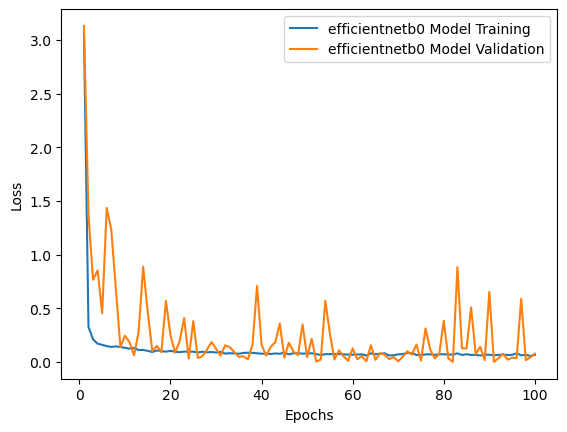

In [14]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot(x, history_efficientnetb0.history['loss'], label = "efficientnetb0 Model Training", linestyle="-")
plt.plot(x, history_efficientnetb0.history['val_loss'], label = "efficientnetb0 Model Validation", linestyle="-")
plt.legend()
plt.show()

In [15]:
true_value = []
pred_efficientnetb0 = []

for folder in os.listdir(test_folders):
    
    test_image_ids = os.listdir(os.path.join(test_folders,folder))
    
    for image_id in test_image_ids[:int(len(test_image_ids))]:
        
        path = os.path.join(test_folders,folder,image_id)
        
        true_value.append(test_generator.class_indices[folder])
        img = cv2.resize(cv2.imread(path),(299,299))
        img_normalized = img/255
        
        image_efficientnetb0_prediction = efficientnetb0.predict(np.array([img_normalized])).argmax()
        pred_efficientnetb0.append(image_efficientnetb0_prediction)
        
print(true_value)
print(pred_efficientnetb0)

1/1 [==============================] - 3s 3s/step

1/1 [==============================] - 0s 31ms/step

1/1 [==============================] - 0s 31ms/step

1/1 [==============================] - 0s 41ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 42ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 28ms/step

1/1 [==============================] - 0s 28ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 27ms/step

1/1 [==============================] - 0s 28ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 27ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 33ms/step

1/1 [==============================] - 0s 31ms/s

In [16]:
from sklearn.metrics import confusion_matrix
import itertools
def clf_report(true_value, model_pred):
    classes = test_generator.class_indices.keys()
    TP_count = [true_value[i] == model_pred[i] for i in range(len(true_value))]
    model_accuracy = np.sum(TP_count)/len(TP_count)
    print('Model Accuracy', model_accuracy)

    plt.figure(figsize=(7,7))
    cm = confusion_matrix(true_value,model_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max()*0.8
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j],
                horizontalalignment="center",
                color="black" if cm[i,j] > thresh else "white")
        pass

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    pass

    print(classification_report(true_value, model_pred, target_names = list(classes)))

Model Accuracy 0.9086538461538461

              precision    recall  f1-score   support



      NORMAL       0.97      0.78      0.86       234

   PNEUMONIA       0.88      0.99      0.93       390



    accuracy                           0.91       624

   macro avg       0.93      0.88      0.90       624

weighted avg       0.92      0.91      0.91       624




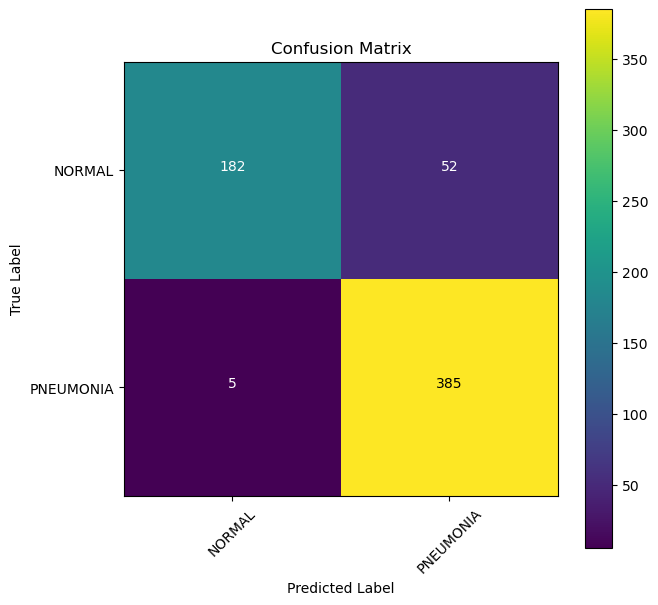

In [17]:
clf_report(true_value, pred_efficientnetb0)

In [18]:
models = [efficientnetb0]

1/1 [==============================] - 0s 35ms/step

1/1 [==============================] - 0s 33ms/step

1/1 [==============================] - 0s 33ms/step

1/1 [==============================] - 0s 31ms/step

1/1 [==============================] - 0s 36ms/step

1/1 [==============================] - 0s 36ms/step

1/1 [==============================] - 0s 33ms/step

1/1 [==============================] - 0s 32ms/step

1/1 [==============================] - 0s 32ms/step

1/1 [==============================] - 0s 34ms/step

1/1 [==============================] - 0s 34ms/step

1/1 [==============================] - 0s 32ms/step

1/1 [==============================] - 0s 35ms/step

1/1 [==============================] - 0s 33ms/step

1/1 [==============================] - 0s 31ms/step

1/1 [==============================] - 0s 33ms/step

1/1 [==============================] - 0s 33ms/step

1/1 [==============================] - 0s 36ms/step

1/1 [==============================] - 0s 31ms

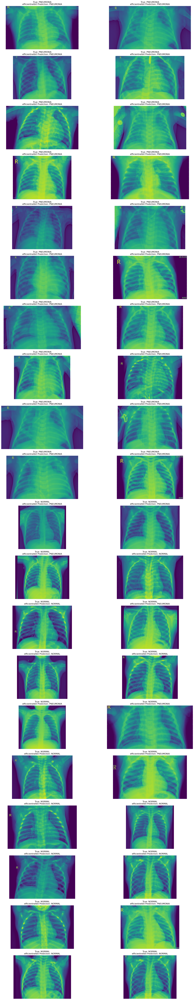

In [19]:
show_few_images(20, models)